# I. Бинарная классификация изображений

## Подготовка данных

*Импорт необходиых библиотек*

In [1]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import random
import plotly.express as px
import scipy as sp

from scipy import ndimage
from shutil import copyfile
from tensorflow.keras.layers import Conv2D, Add, MaxPooling2D, Dense, BatchNormalization, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator 

Загрузка исходных данных

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
class_names = ['Cat', 'Dog'] 

n_dogs = len(os.listdir("drive/MyDrive/PetImages/Dog"))
n_cats = len(os.listdir("drive/MyDrive/PetImages/Cat"))
n_images = [n_cats, n_dogs]
px.pie(names=class_names, values=n_images)

Исходные данные идеально сбалансированы по количеству фотографий каждого класса

Создание директорий для файлов и импортирование изображений в них

In [4]:
  os.mkdir('/tmp/cats-v-dogs')
  os.mkdir('/tmp/cats-v-dogs/training')
  os.mkdir('/tmp/cats-v-dogs/validation')
  os.mkdir('/tmp/cats-v-dogs/test')
  os.mkdir('/tmp/cats-v-dogs/training/cats')
  os.mkdir('/tmp/cats-v-dogs/training/dogs')
  os.mkdir('/tmp/cats-v-dogs/validation/cats')
  os.mkdir('/tmp/cats-v-dogs/validation/dogs')
  os.mkdir('/tmp/cats-v-dogs/test/cats')
  os.mkdir('/tmp/cats-v-dogs/test/dogs')

In [5]:
CAT_DIR = '/content/drive/MyDrive/PetImages/Cat'
DOG_DIR = '/content/drive/MyDrive/PetImages/Dog'

TRAINING_DIR = "/tmp/cats-v-dogs/training/"
VALIDATION_DIR = "/tmp/cats-v-dogs/validation/"

TRAINING_CATS = os.path.join(TRAINING_DIR, "cats/")
VALIDATION_CATS = os.path.join(VALIDATION_DIR, "cats/")

TRAINING_DOGS = os.path.join(TRAINING_DIR, "dogs/")
VALIDATION_DOGS = os.path.join(VALIDATION_DIR, "dogs/")

INCLUDE_TEST = True

In [6]:
print(len(os.listdir('/tmp/cats-v-dogs/training/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/training/dogs')))

print(len(os.listdir('/tmp/cats-v-dogs/validation/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/validation/dogs')))

print(len(os.listdir('/tmp/cats-v-dogs/test/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/test/dogs')))

0
0
0
0
0
0


Убедились, что папки пустые

In [44]:
def split_data(main_dir, training_dir, validation_dir, test_dir=None, include_test_split=True,  split_size=0.9):
    """
    Args:
    main_dir (string): путь до изображения 
    training_dir (string): путь до папки с тренировочными данными
    validation_dir (string): путь до папки с валидационными данными
    test_dir (string): путь до папки с тестовыми данными
    include_test_split (boolen): включены ли тестовые данные 
    split_size (float): объем данных
    """
    files = []
    for file in os.listdir(main_dir):
        if os.path.getsize(os.path.join(main_dir, file)): # не равен ли размер файла нулю
            files.append(file)

    shuffled_files = random.sample(files,  len(files))
    split = int(0.9 * len(shuffled_files))
    train = shuffled_files[:split]
    split_valid_test = int(split + (len(shuffled_files) - split) / 2)
   
    if include_test_split:
        validation = shuffled_files[split:split_valid_test]
        test = shuffled_files[split_valid_test:]
    else:
        validation = shuffled_files[split:]

    for element in train:
        copyfile(os.path.join(main_dir,  element), os.path.join(training_dir, element))

    for element in validation:
        copyfile(os.path.join(main_dir,  element), os.path.join(validation_dir, element))
        
    if include_test_split:
        for element in test:
            copyfile(os.path.join(main_dir,  element), os.path.join(test_dir, element))
    print("Разделение прошло успешно!")

In [45]:
split_data(CAT_DIR, '/tmp/cats-v-dogs/training/cats', '/tmp/cats-v-dogs/validation/cats', '/tmp/cats-v-dogs/test/cats',INCLUDE_TEST, 0.9)
split_data(DOG_DIR, '/tmp/cats-v-dogs/training/dogs', '/tmp/cats-v-dogs/validation/dogs','/tmp/cats-v-dogs/test/dogs',INCLUDE_TEST, 0.9)

Разделение прошло успешно!
Разделение прошло успешно!


Проверка наличия файлов в папке

In [9]:
print(len(os.listdir('/tmp/cats-v-dogs/training/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/training/dogs')))

print(len(os.listdir('/tmp/cats-v-dogs/validation/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/validation/dogs')))

print(len(os.listdir('/tmp/cats-v-dogs/test/cats')))
print(len(os.listdir('/tmp/cats-v-dogs/test/dogs')))

11250
11250
625
625
625
625


Создание генератора изображений для передачи для передачи образца данных в модель

In [10]:
train_gen = ImageDataGenerator(
        rescale=1./255)


validation_gen =  ImageDataGenerator(
        rescale=1./255.)

if INCLUDE_TEST:
    test_gen =  ImageDataGenerator(
            rescale=1./255.)

In [11]:
train_generator = train_gen.flow_from_directory(
        TRAINING_DIR,
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')
validation_generator = validation_gen.flow_from_directory(
        VALIDATION_DIR,
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')

if INCLUDE_TEST:
    test_generator = test_gen.flow_from_directory(
        VALIDATION_DIR,
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary')

Found 22498 images belonging to 2 classes.
Found 1250 images belonging to 2 classes.
Found 1250 images belonging to 2 classes.


Убедимся, что данные корректные

In [12]:
class_names = ['Cat', 'Dog']
def plot_data(generator, n_images):
    i = 1
    images, labels = generator.next()
    labels = labels.astype('int32')

    plt.figure(figsize=(14, 15))
    
    for image, label in zip(images, labels):
        plt.subplot(4, 3, i)
        plt.imshow(image)
        plt.title(class_names[label])
        plt.axis('off')
        i += 1
        if i == n_images:
            break
    
    plt.show()

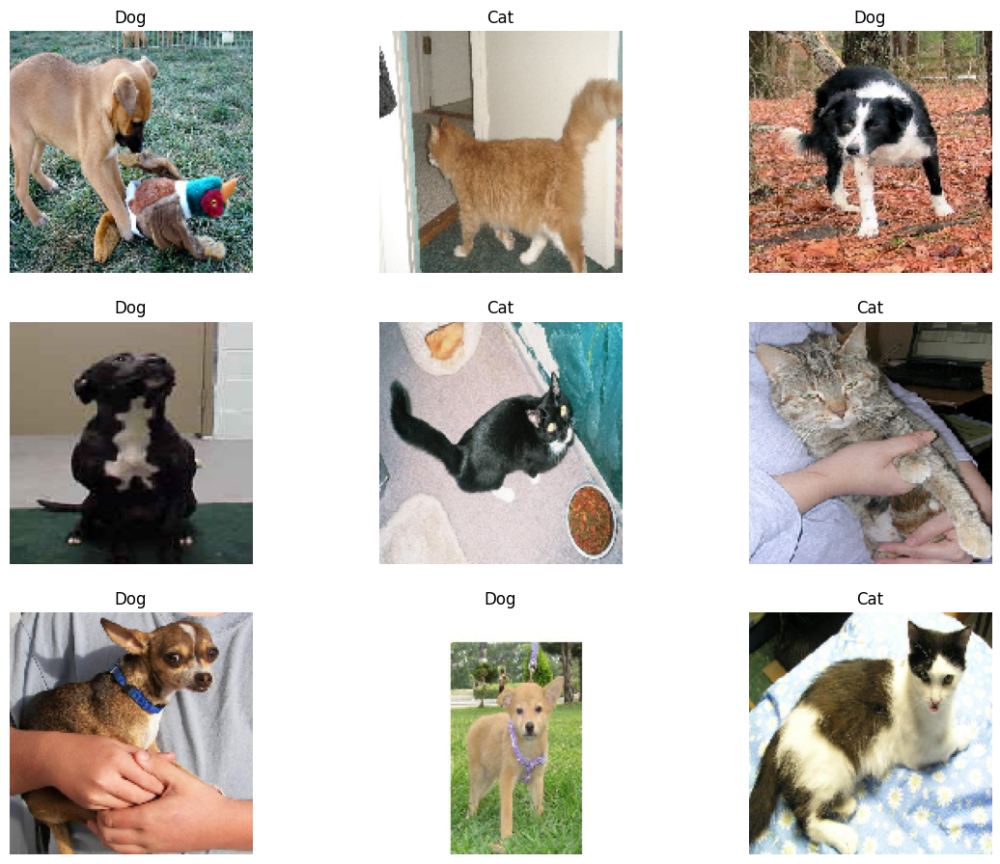

In [43]:
plot_data(train_generator, 10)

## Создание и обучение модели

In [46]:
inputs = tf.keras.layers.Input(shape=(150,150,3))
x =  tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(inputs)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2, 2)(x)

x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2, 2)(x)

x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), activation='relu')(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = Dense(1024,activation='relu')(x)
x = tf.keras.layers.Dense(2, activation='softmax')(x) 

model = Model(inputs=inputs, outputs=x)

In [15]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics = ['accuracy'])

In [16]:
r = model.fit(
        train_generator,
        epochs=10,#Training longer could yield better results
        validation_data=validation_generator)

Epoch 1/10
 32/352 [=>............................] - ETA: 1:24 - loss: 0.6940 - accuracy: 0.5024

/usr/local/lib/python3.10/dist-packages/PIL/TiffImagePlugin.py:819: UserWarning:

Truncated File Read



352/352 [==============================] - 121s 295ms/step - loss: 0.6809 - accuracy: 0.5495 - val_loss: 0.6536 - val_accuracy: 0.5872
Epoch 2/10
352/352 [==============================] - 98s 278ms/step - loss: 0.6478 - accuracy: 0.6193 - val_loss: 0.6282 - val_accuracy: 0.6832
Epoch 3/10
352/352 [==============================] - 96s 273ms/step - loss: 0.6195 - accuracy: 0.6574 - val_loss: 0.5741 - val_accuracy: 0.7080
Epoch 4/10
352/352 [==============================] - 96s 272ms/step - loss: 0.5895 - accuracy: 0.6889 - val_loss: 0.5621 - val_accuracy: 0.7000
Epoch 5/10
352/352 [==============================] - 98s 277ms/step - loss: 0.5656 - accuracy: 0.7122 - val_loss: 0.5338 - val_accuracy: 0.7256
Epoch 6/10
352/352 [==============================] - 95s 271ms/step - loss: 0.5541 - accuracy: 0.7238 - val_loss: 0.5024 - val_accuracy: 0.7488
Epoch 7/10
352/352 [==============================] - 106s 300ms/step - loss: 0.5400 - accuracy: 0.7329 - val_loss: 0.4850 - val_accuracy: 0

In [17]:
if INCLUDE_TEST:
    model.evaluate(test_generator)

20/20 [==============================] - 4s 201ms/step - loss: 0.4752 - accuracy: 0.7696


In [18]:
def plot_prediction(generator, n_images):
    """
    Тестирование модели.
    """
    i = 1

    images, labels = generator.next()

    preds = model.predict(images)
    predictions = np.argmax(preds, axis=1)
    labels = labels.astype('int32')
    plt.figure(figsize=(14, 15))
    for image, label in zip(images, labels):
        plt.subplot(4, 3, i)
        plt.imshow(image)
        if predictions[i] == labels[i]:
            title_obj = plt.title(class_names[label])
            plt.setp(title_obj, color='g') 
            plt.axis('off')
        else:
            title_obj = plt.title(class_names[label])
            plt.setp(title_obj, color='r') 
            plt.axis('off')
        i += 1
        if i == n_images:
            break
    
    plt.show()

2/2 [==============================] - 1s 9ms/step


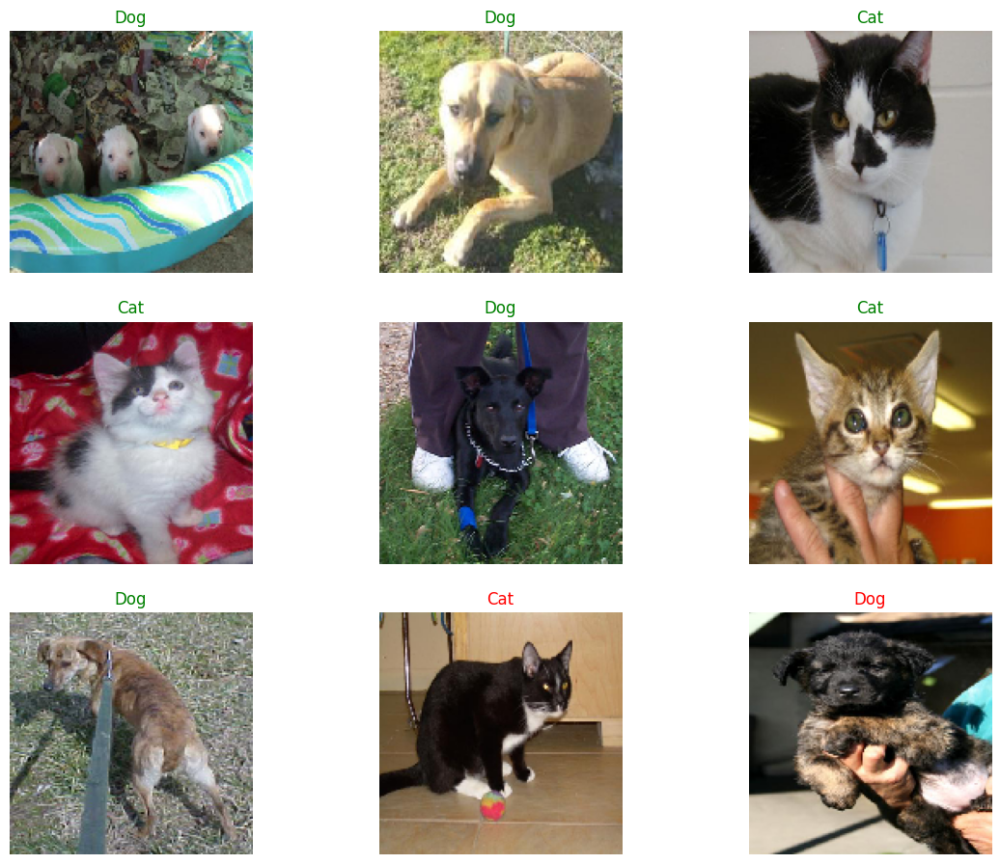

In [19]:
if INCLUDE_TEST:
    plot_prediction(test_generator, 10)


In [20]:
gp_weights =  model.get_layer('dense').get_weights()[0]
activation_model = Model(model.inputs, outputs=(model.get_layer('conv2d_5').output, model.get_layer('dense_1').output))

In [21]:
images, _ = test_generator.next()
features, results = activation_model.predict(images)

2/2 [==============================] - 0s 10ms/step


In [22]:
def show_cam(image_index, features, results):
    features_for_img = features[image_index,:,:,:]

    prediction = np.argmax(results[image_index])

    class_activation_weights = gp_weights[:,prediction]

    # подгон изображений под размер 150x150
    class_activation_features = sp.ndimage.zoom(features_for_img, (150/30, 150/30, 1), order=2)

    cam_output  = np.dot(class_activation_features,class_activation_weights)

    print('Predicted Class = ' + str(class_names[prediction]) + ', Probability = ' + str(results[image_index][prediction]))

    
    plt.imshow(images[image_index])

    # подпись крассная, если точность менее 95%, иначе зеленая
    if results[image_index][prediction] > 0.95:
        cmap_str = 'Greens'
    else:
        cmap_str = 'Blues'

    plt.imshow(cam_output, cmap=cmap_str, alpha=0.5)

    # отображение изображения 
    plt.show()

In [23]:
def show_maps(desired_class, num_maps):
    counter = 0
    # простматриваем первые 10000 изображений
    for i in range(0, 10000):
        if counter == num_maps:
            break
        if np.argmax(results[i]) == desired_class:
            counter += 1
            show_cam(i,features, results)

Predicted Class = Dog, Probability = 0.5613227


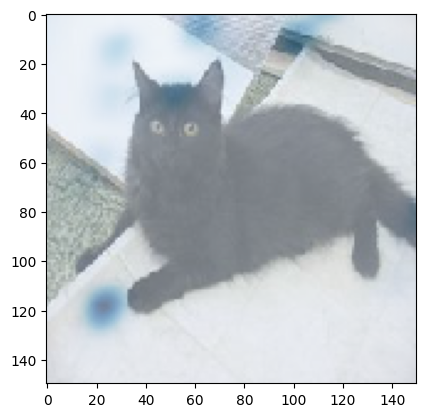

Predicted Class = Dog, Probability = 0.7721845


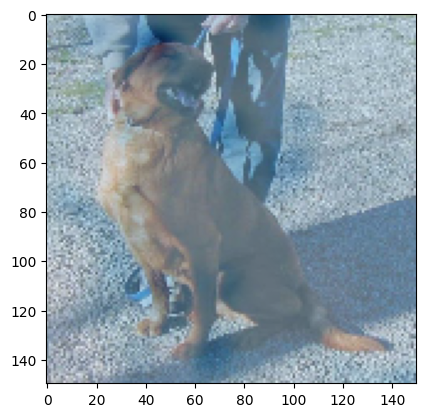

Predicted Class = Dog, Probability = 0.67297333


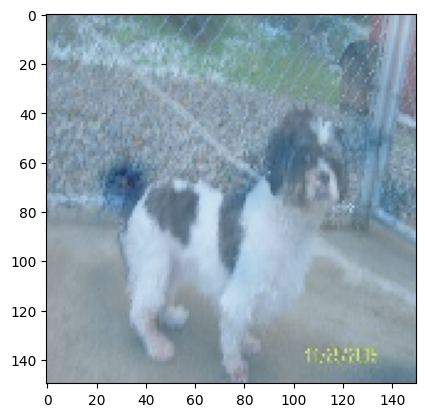

Predicted Class = Dog, Probability = 0.84017754


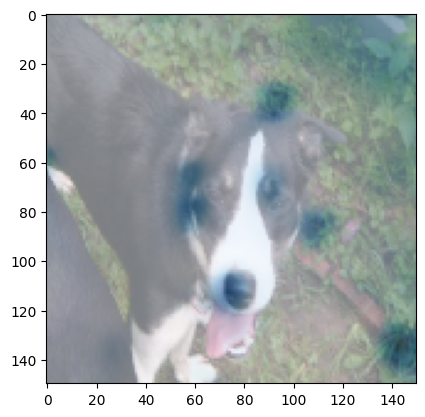

Predicted Class = Dog, Probability = 0.9815812


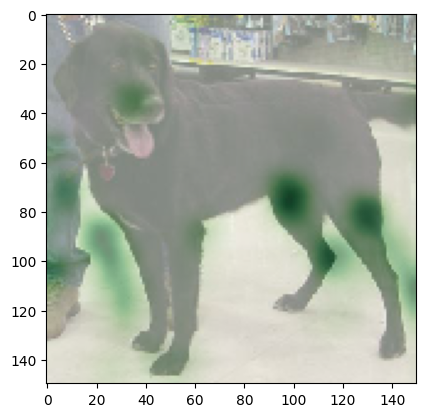

In [24]:
show_maps(desired_class=1, num_maps=5)

Predicted Class = Cat, Probability = 0.77267593


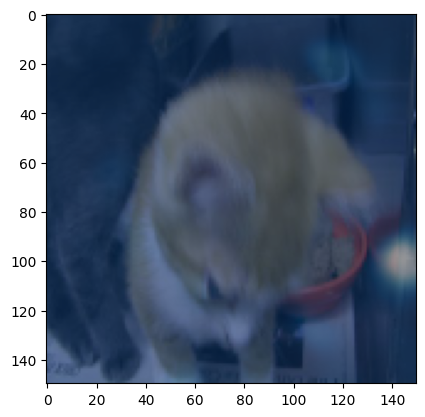

Predicted Class = Cat, Probability = 0.86536753


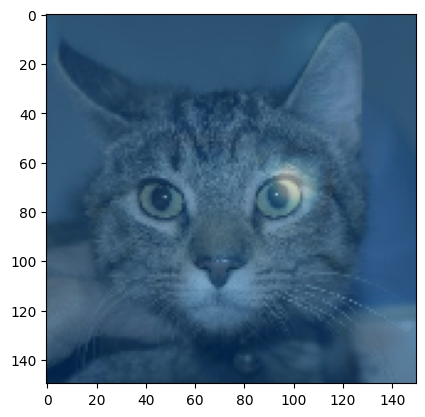

Predicted Class = Cat, Probability = 0.8375496


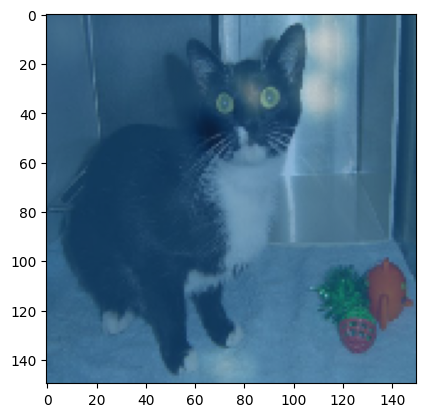

Predicted Class = Cat, Probability = 0.89029425


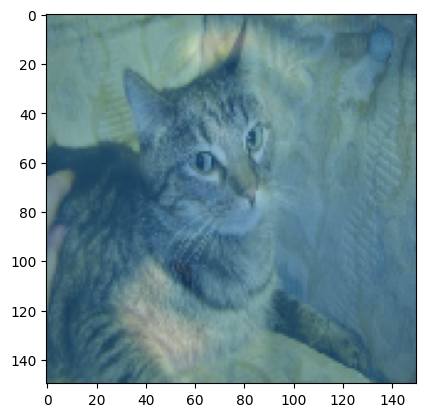

Predicted Class = Cat, Probability = 0.907169


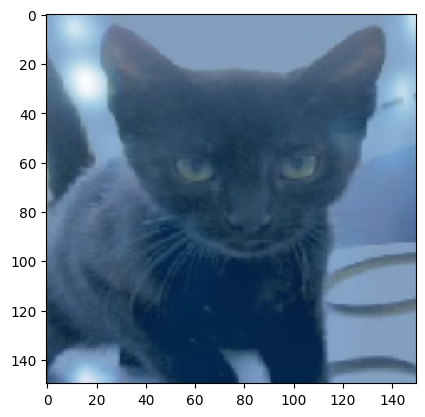

In [25]:
show_maps(desired_class=0, num_maps=5)

## Оценка точности модели

In [34]:
results = pd.DataFrame(r.history)
results

,loss,accuracy,val_loss,val_accuracy
0,0.680926,0.549471,0.653568,0.5872
1,0.647848,0.619344,0.628234,0.6832
2,0.619501,0.657392,0.574083,0.7080
3,0.589545,0.688861,0.562088,0.7000
4,0.565560,0.712152,0.533816,0.7256
5,0.554146,0.723753,0.502372,0.7488
6,0.540006,0.732910,0.484991,0.7616
7,0.526685,0.742733,0.478352,0.7816
8,0.513533,0.756289,0.509243,0.7472
9,0.491738,0.768068,0.475197,0.7696


In [42]:
fig = px.line(results, y=[results['accuracy'], results['val_accuracy']])
fig.show()

In [32]:
fig = px.line(results, y=[results['loss'], results['val_loss']])
fig.show()

# II. Классификация Oxford Pets

Обучим сеть для классификации исходного датасета [Oxford-IIIT Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/).

Решить задачу классификации пород кошек и собак на основе датасета [Oxford-IIIT]

Используем оригинальный датасет **[Oxford Pets](https://www.kaggle.com/datasets/tanlikesmath/the-oxfordiiit-pet-dataset)** и предобученные сети VGG-16/VGG-19 и ResNet для построения классификатора пород. 

В качестве результата:

* Обучить три классификатора пород: на основе VGG-16/19 и на основе ResNet.
* Посчитать точность классификатора на тестовом датасете отдельно для каждого из классификаторов, для дальнейших действий выбрать сеть с лучшей точностью
* Посчитать точность бинарной классификации cat_vs_dog такой сетью на тестовом датасете
* Построить confusion matrix

In [ ]:
!pip install wget

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=b53733a60692eb003c088120b1d7963f8649f83fcb61d4a24285b011cc8416cc
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [ ]:
import os
import wget
import tarfile
import pandas as pd
import tensorflow as tf
import sklearn
import matplotlib.pyplot as plt
import seaborn as sn
from fastai.vision.all import *
from IPython.display import Markdown as md

# Получаем датасет

In [ ]:
url_1 = "https://thor.robots.ox.ac.uk/~vgg/data/pets/images.tar.gz"
url_2 = "https://thor.robots.ox.ac.uk/~vgg/data/pets/annotations.tar.gz"

wget.download(url_1)
wget.download(url_2)

'annotations.tar.gz'

In [ ]:
with tarfile.open("images.tar.gz") as tar:
    tar.extractall()

with tarfile.open("annotations.tar.gz") as tar:
    tar.extractall()

In [ ]:
path_img = "images"

In [ ]:
image_files = os.listdir(path_img)

### Вспомогательные функции

Для визуализации изображений используйте функцию:

In [ ]:
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np

def display_images(l,titles=None,fontsize=12):
    n=len(l)
    fig,ax = plt.subplots(1,n)
    for i,im in enumerate(l):
        ax[i].imshow(im)
        ax[i].axis('off')
        if titles is not None:
            ax[i].set_title(titles[i],fontsize=fontsize)
    fig.set_size_inches(fig.get_size_inches()*n)
    plt.tight_layout()
    plt.show()

### Проверка вывода

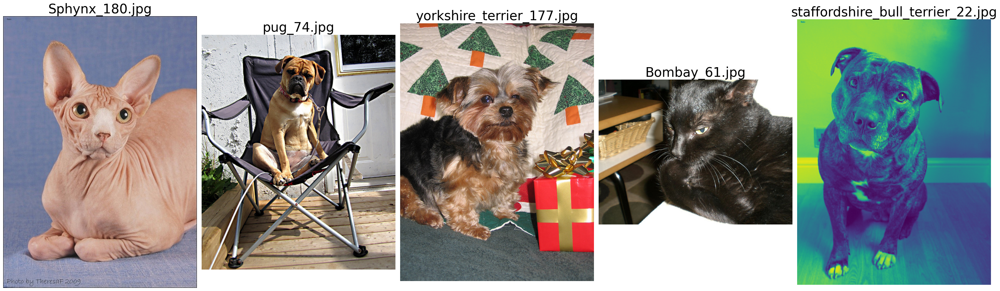

In [ ]:
display_images([Image.open(os.path.join(path_img, x)) for x in image_files[:5]], titles=image_files[:5],fontsize=30)

### Разделение на классы

In [ ]:
image_files.sort()

In [ ]:
for i in image_files[:5]:
  print(i)

Abyssinian_1.jpg
Abyssinian_10.jpg
Abyssinian_100.jpg
Abyssinian_100.mat
Abyssinian_101.jpg


In [ ]:
df = pd.read_csv(
    "annotations/list.txt",
    delimiter=" ",
    skiprows=6,
    header=None,
    names=["stem", "class_id", "species", "breed"]
)
df["class_name"] = df.stem.map(lambda x: x[:x.rfind("_")].lower())
classes_data = df[["class_name"]].drop_duplicates().reset_index(drop=True)

classes = list(classes_data["class_name"])
for i in classes:
  os.makedirs(f"images/{i}", exist_ok=True)
  if (os.listdir(f"images/{i}")):
    continue
  else:
    for j in image_files:
      if (i in j.lower()):
        os.replace(f"images/{j}", f"images/{i}/{j}")

 Входные изображения должны быть 224x224 - модели предобучены на изображениях таких размеров

In [ ]:
size = 224
b_size = 32

train, test = [tf.keras.preprocessing.image_dataset_from_directory(path_img, image_size = (size, size), validation_split=0.2, subset=subs, batch_size=b_size, seed=2) for subs in ['training', 'validation']]

Found 7390 files belonging to 37 classes.
Using 5912 files for training.
Found 7390 files belonging to 37 classes.
Using 1478 files for validation.


# 1 классификатор: VGG-16

In [ ]:
vgg16_my = tf.keras.applications.VGG16(
    include_top=False,
    input_shape=(size,size,3),
    classes=37
)

58889256/58889256 [==============================] - 4s 0us/step


In [ ]:
model_16 = tf.keras.models.Sequential()
model_16.add(tf.keras.layers.Lambda(tf.keras.applications.vgg16.preprocess_input))
model_16.add(vgg16_my)
model_16.add(tf.keras.layers.Flatten())
model_16.add(tf.keras.layers.Dense(37, activation='softmax'))

model_16.layers[1].trainable = False

# 2 классификатор: VGG-19

In [ ]:
vgg19_my = tf.keras.applications.VGG19(
    include_top=False,
    input_shape=(size,size,3),
    classes=37
)

80134624/80134624 [==============================] - 5s 0us/step


In [ ]:
model_19 = tf.keras.models.Sequential()
model_19.add(tf.keras.layers.Lambda(tf.keras.applications.vgg19.preprocess_input))
model_19.add(vgg19_my)
model_19.add(tf.keras.layers.Flatten())
model_19.add(tf.keras.layers.Dense(37, activation='softmax'))

model_19.layers[1].trainable = False

# 3 классификатор: ResNet

In [ ]:
ResNet = tf.keras.applications.ResNet50(
    include_top=False,
    input_shape=(224, 224, 3),
    classes=37
)

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
model_resnet = tf.keras.models.Sequential()
model_resnet.add(tf.keras.layers.Lambda(tf.keras.applications.resnet50.preprocess_input))
model_resnet.add(ResNet)
model_resnet.add(tf.keras.layers.Flatten())
model_resnet.add(tf.keras.layers.Dense(37, activation='softmax'))

model_resnet.layers[1].trainable = False

# Точность на тестовых данных для всех моделей

### VGG-16

In [ ]:
model_16.compile(loss='sparse_categorical_crossentropy',metrics=['acc'],optimizer='sgd')
hist_16 = model_16.fit(train,validation_data=test,epochs=5)

Epoch 1/5
185/185 [==============================] - 50s 203ms/step - loss: 215.0644 - acc: 0.6507 - val_loss: 222.5567 - val_acc: 0.6800
Epoch 2/5
185/185 [==============================] - 30s 160ms/step - loss: 42.6464 - acc: 0.9024 - val_loss: 172.0615 - val_acc: 0.7334
Epoch 3/5
185/185 [==============================] - 31s 163ms/step - loss: 16.0584 - acc: 0.9564 - val_loss: 107.8255 - val_acc: 0.8166
Epoch 4/5
185/185 [==============================] - 31s 164ms/step - loss: 5.4119 - acc: 0.9792 - val_loss: 103.7860 - val_acc: 0.8085
Epoch 5/5
185/185 [==============================] - 31s 167ms/step - loss: 3.9737 - acc: 0.9817 - val_loss: 104.0826 - val_acc: 0.8119


In [ ]:
hist_16.history

{'loss': [215.0644073486328,
  42.646366119384766,
  16.058374404907227,
  5.4119367599487305,
  3.9737038612365723],
 'acc': [0.65071040391922,
  0.9024019241333008,
  0.9563599228858948,
  0.9791948795318604,
  0.9817320704460144],
 'val_loss': [222.5566864013672,
  172.06153869628906,
  107.82554626464844,
  103.78599548339844,
  104.08258819580078],
 'val_acc': [0.6799729466438293,
  0.7334235310554504,
  0.8166441321372986,
  0.808525025844574,
  0.8119080066680908]}

In [ ]:
results = model_16.evaluate(test, batch_size=32)
print('test loss, test acc:', results)

47/47 [==============================] - 7s 129ms/step - loss: 104.0826 - acc: 0.8119
test loss, test acc: [104.08257293701172, 0.8119080066680908]


### VGG-19

In [ ]:
model_19.compile(loss='sparse_categorical_crossentropy',metrics=['acc'],optimizer='sgd')
hist_19 = model_19.fit(train,validation_data=test,epochs=5)

Epoch 1/5
185/185 [==============================] - 39s 204ms/step - loss: 169.7050 - acc: 0.6729 - val_loss: 135.7044 - val_acc: 0.7395
Epoch 2/5
185/185 [==============================] - 41s 218ms/step - loss: 33.4595 - acc: 0.9036 - val_loss: 96.5717 - val_acc: 0.8038
Epoch 3/5
185/185 [==============================] - 37s 196ms/step - loss: 10.8259 - acc: 0.9581 - val_loss: 92.1150 - val_acc: 0.8085
Epoch 4/5
185/185 [==============================] - 38s 203ms/step - loss: 5.0875 - acc: 0.9805 - val_loss: 77.9471 - val_acc: 0.8410
Epoch 5/5
185/185 [==============================] - 38s 205ms/step - loss: 2.5763 - acc: 0.9849 - val_loss: 89.4762 - val_acc: 0.8356


In [ ]:
hist_19.history

{'loss': [169.7050323486328,
  33.459510803222656,
  10.825883865356445,
  5.087521076202393,
  2.5762555599212646],
 'acc': [0.6728687286376953,
  0.9035859107971191,
  0.9580514430999756,
  0.9805480241775513,
  0.9849458932876587],
 'val_loss': [135.70437622070312,
  96.57173156738281,
  92.11495971679688,
  77.94710540771484,
  89.47615814208984],
 'val_acc': [0.7395128607749939,
  0.8037889003753662,
  0.808525025844574,
  0.8410013318061829,
  0.8355886340141296]}

In [ ]:
results = model_19.evaluate(test, batch_size=32)
print('test loss, test acc:', results)

47/47 [==============================] - 8s 161ms/step - loss: 89.4762 - acc: 0.8356
test loss, test acc: [89.47615051269531, 0.8355886340141296]


ResNet 50

In [ ]:
model_resnet.compile(loss='sparse_categorical_crossentropy',metrics=['acc'],optimizer='sgd')
hist_net = model_resnet.fit(train,validation_data=test,epochs=5)

Epoch 1/5
185/185 [==============================] - 32s 144ms/step - loss: 9.5808 - acc: 0.7289 - val_loss: 6.0618 - val_acc: 0.8065
Epoch 2/5
185/185 [==============================] - 30s 157ms/step - loss: 1.1891 - acc: 0.9433 - val_loss: 6.0479 - val_acc: 0.8342
Epoch 3/5
185/185 [==============================] - 25s 131ms/step - loss: 0.3317 - acc: 0.9782 - val_loss: 5.4426 - val_acc: 0.8363
Epoch 4/5
185/185 [==============================] - 25s 132ms/step - loss: 0.1748 - acc: 0.9863 - val_loss: 4.2252 - val_acc: 0.8525
Epoch 5/5
185/185 [==============================] - 25s 134ms/step - loss: 0.0349 - acc: 0.9961 - val_loss: 4.4570 - val_acc: 0.8552


In [ ]:
hist_net.history

{'loss': [9.580759048461914,
  1.1891026496887207,
  0.3316967785358429,
  0.17476250231266022,
  0.03487487882375717],
 'acc': [0.7288565635681152,
  0.9433355927467346,
  0.9781799912452698,
  0.9862990379333496,
  0.9961096048355103],
 'val_loss': [6.061757564544678,
  6.047916889190674,
  5.442556858062744,
  4.225198268890381,
  4.456984519958496],
 'val_acc': [0.8064952492713928,
  0.834235429763794,
  0.8362652063369751,
  0.8525033593177795,
  0.8552097678184509]}

In [ ]:
results = model_resnet.evaluate(test, batch_size=32)
print('test loss, test acc:', results)

47/47 [==============================] - 6s 113ms/step - loss: 4.4570 - acc: 0.8552
test loss, test acc: [4.45698356628418, 0.8552097678184509]


### Находим наилучшую accuracy

In [ ]:
max_list = [hist_16.history['val_acc'][4],  hist_19.history['val_acc'][4], hist_net.history['val_acc'][4]]
max_list

[0.8119080066680908, 0.8355886340141296, 0.8552097678184509]

In [ ]:
temp = max(max_list)
res = [i for i, j in enumerate(max_list) if j == temp]
res

[2]

### Confusion matrix для модели с наилучшей accuracy

In [ ]:
test_generator = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.2)
test_data_generator = test_generator.flow_from_directory(
    'images',
     target_size=(size, size),
     subset="validation",
    batch_size=32,
    shuffle=False)
test_steps_per_epoch = np.math.ceil(test_data_generator.samples / test_data_generator.batch_size)

predictions = model_resnet.predict_generator(test_data_generator, steps=test_steps_per_epoch)
predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())

Found 1477 images belonging to 37 classes.


<ipython-input-31-ee81c21de686>:10: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions = model_resnet.predict_generator(test_data_generator, steps=test_steps_per_epoch)


In [ ]:
report = sklearn.metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

                            precision    recall  f1-score   support

                abyssinian       0.95      0.97      0.96        40
          american_bulldog       0.86      0.93      0.89        40
 american_pit_bull_terrier       0.97      0.70      0.81        40
              basset_hound       1.00      0.93      0.96        40
                    beagle       0.95      1.00      0.98        40
                    bengal       0.97      0.97      0.97        40
                    birman       0.94      0.80      0.86        40
                    bombay       0.98      1.00      0.99        40
                     boxer       0.95      1.00      0.98        40
         british_shorthair       1.00      0.95      0.97        40
                 chihuahua       1.00      0.97      0.99        40
              egyptian_mau       1.00      0.97      0.99        40
    english_cocker_spaniel       0.89      1.00      0.94        40
            english_setter       0.95      0.93

<Axes: >

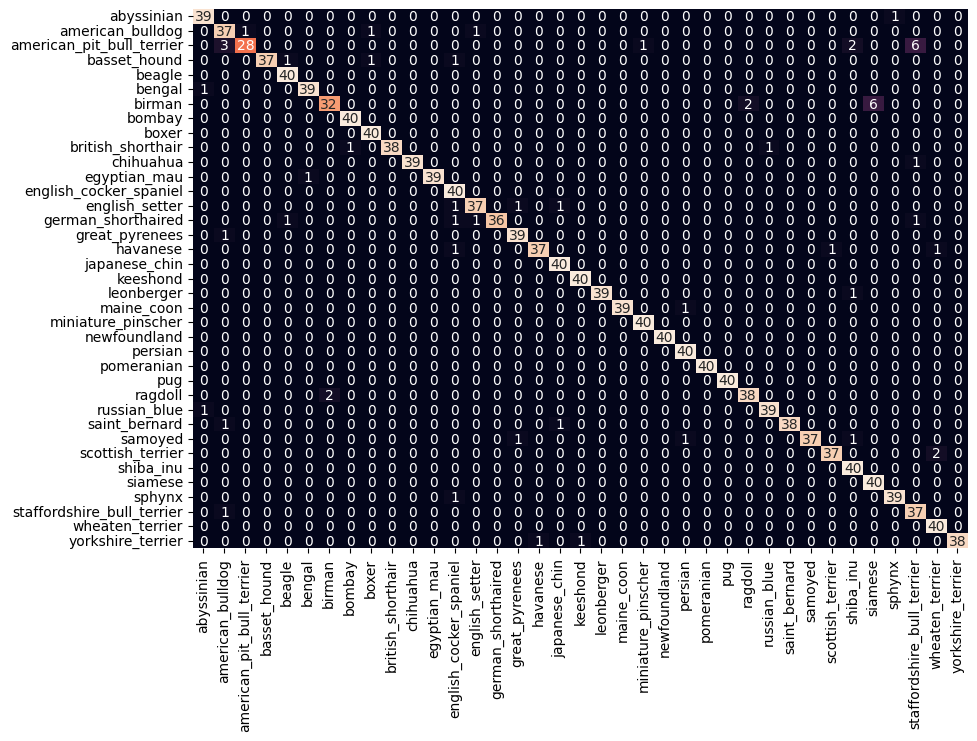

In [ ]:
conf_matrix = sklearn.metrics.confusion_matrix(true_classes, predicted_classes)
df_cm = pd.DataFrame(conf_matrix, index = [i for i in classes],
                  columns = [i for i in classes])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True, cbar=False)

Лучшая точность получилась у сети ResNet, поэтому будем использовать ее для бинарной классификации изображений кошек и собак

# Реализация бинарной классификации

## Перенести все файлы в соответствующие директории

In [ ]:
import shutil

In [ ]:
species_data = df[["species", "class_name"]].drop_duplicates().reset_index(drop=True)

species = list(species_data["species"])
os.makedirs(f"cats_vs_dogs/cats", exist_ok=True)
os.makedirs(f"cats_vs_dogs/dogs", exist_ok=True)
for i in range(len(classes)):
  if species[i] == 1: # кошки
    file_destination = "cats_vs_dogs/cats/"
    file_source = f"images/{classes[i]}/"
    get_files = os.listdir(file_source)
    for g in get_files:
      shutil.copyfile(file_source + g, file_destination + g)
  else:               # собаки
    file_destination = "cats_vs_dogs/dogs/"
    file_source = f"images/{classes[i]}/"
    get_files = os.listdir(file_source)
    for g in get_files:
      shutil.copyfile(file_source + g, file_destination + g)

### Считаем с помощью ResNet

In [ ]:
train_bin, test_bin = [tf.keras.preprocessing.image_dataset_from_directory("cats_vs_dogs", image_size = (size, size), validation_split=0.2, subset=subs, batch_size=b_size, seed=2) for subs in ['training', 'validation']]

Found 7390 files belonging to 2 classes.
Using 5912 files for training.
Found 7390 files belonging to 2 classes.
Using 1478 files for validation.


In [ ]:
ResNet_bin = tf.keras.applications.ResNet50(
    include_top=False,
    input_shape=(size, size, 3),
    classes=2
)

In [ ]:
model_resnet_bin = tf.keras.models.Sequential()
model_resnet_bin.add(tf.keras.layers.Lambda(tf.keras.applications.resnet50.preprocess_input))
model_resnet_bin.add(ResNet_bin)
model_resnet_bin.add(tf.keras.layers.Flatten())
model_resnet_bin.add(tf.keras.layers.Dense(2, activation='softmax'))

model_resnet.layers[1].trainable = False

In [ ]:
model_resnet_bin.compile(loss='sparse_categorical_crossentropy',metrics=['acc'],optimizer='sgd')
hist_net = model_resnet_bin.fit(train_bin,validation_data=test_bin,epochs=5)

Epoch 1/5
185/185 [==============================] - 88s 347ms/step - loss: 3.0164 - acc: 0.7387 - val_loss: 6.8253 - val_acc: 0.6793
Epoch 2/5
185/185 [==============================] - 64s 343ms/step - loss: 0.4616 - acc: 0.8868 - val_loss: 0.6396 - val_acc: 0.8518
Epoch 3/5
185/185 [==============================] - 67s 358ms/step - loss: 0.2011 - acc: 0.9537 - val_loss: 0.4014 - val_acc: 0.8802
Epoch 4/5
185/185 [==============================] - 66s 353ms/step - loss: 0.0693 - acc: 0.9839 - val_loss: 0.3531 - val_acc: 0.9046
Epoch 5/5
185/185 [==============================] - 68s 360ms/step - loss: 0.0514 - acc: 0.9905 - val_loss: 0.4692 - val_acc: 0.8917


In [ ]:
md(f"# Точность на тестовых данных (кошки против собак): {hist_net.history['val_acc'][4]}")

# Точность на тестовых данных (кошки против собак): 0.8917456269264221

# Confusion matrix

In [ ]:
test_generator = tf.keras.preprocessing.image.ImageDataGenerator(validation_split=0.2)
test_data_generator = test_generator.flow_from_directory(
    'cats_vs_dogs',
     target_size=(size, size),
     subset='validation',
    batch_size=32,
    shuffle=False)
test_steps_per_epoch = np.math.ceil(test_data_generator.samples / test_data_generator.batch_size)

predictions = model_resnet_bin.predict_generator(test_data_generator, steps=test_steps_per_epoch)
predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())

Found 1478 images belonging to 2 classes.


<ipython-input-41-23cf6d4c5358>:10: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predictions = model_resnet_bin.predict_generator(test_data_generator, steps=test_steps_per_epoch)


In [ ]:
report = sklearn.metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

              precision    recall  f1-score   support

        cats       0.96      0.97      0.96       480
        dogs       0.98      0.98      0.98       998

    accuracy                           0.97      1478
   macro avg       0.97      0.97      0.97      1478
weighted avg       0.98      0.97      0.97      1478



<Axes: >

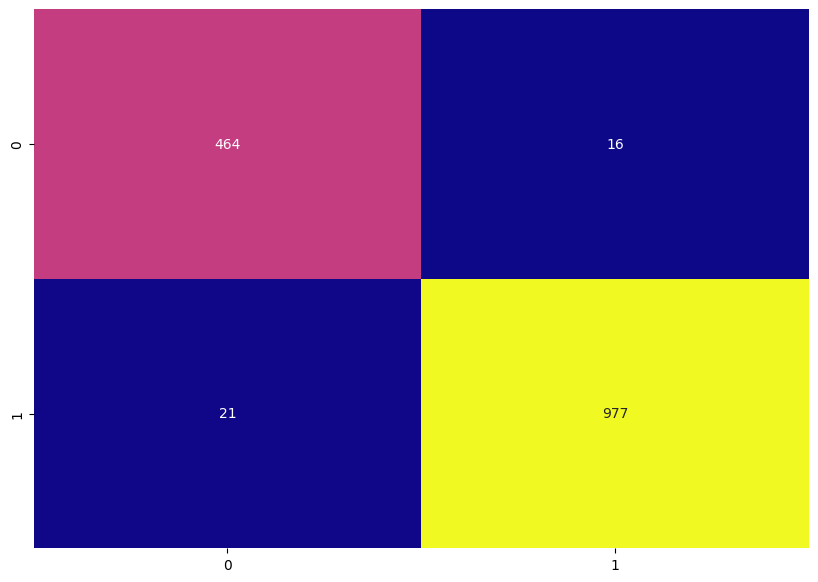

In [ ]:
conf_matrix = sklearn.metrics.confusion_matrix(true_classes, predicted_classes)
df_cm = pd.DataFrame(conf_matrix, index = [i for i in [0,1]],
                  columns = [i for i in [0,1]])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True, cbar=False, cmap='plasma', fmt='g')

# Вывод

ResNet является более глубокой архитектурой сверточной нейронной сети, которая имеет ряд особенностей, позволяющих ей более эффективно классифицировать изображения:

1.   Соединения пропуска. ResNet использует соединения пропуска (skip 
connections), которые передают информацию от одного слоя к другому, обходя некоторые слои. Это позволяет сети сохранять информацию о низкоуровневых деталях изображения и избегать проблемы затухания градиентов при обучении глубоких сетей. Благодаря этому ResNet может эффективно обучаться сетям глубиной в несколько десятков или сотен слоев.
2.   Блоки с остаточным соединением. ResNet состоит из блоков с остаточным соединением (residual blocks), которые позволяют пропустить слои и добавить остаточную (residual) информацию к выходу блока. Это позволяет сети учиться только на разнице между входом и выходом блока, что упрощает обучение и помогает избежать деградации производительности с ростом глубины сети.
3. Более эффективное использование параметров. ResNet позволяет сети учиться только дельтам или изменениям между слоями, вместо того, чтобы полностью моделировать функцию отображения между слоями. Это позволяет сети эффективнее использовать ограниченное количество параметров и улучшает обобщающую способность модели.


В целом, благодаря соединениям пропуска и блокам с остаточным соединением, ResNet обладает способностью обучаться глубоким сверточным нейронным сетям без проблемы затухания градиентов и деградации производительности. Это позволяет ей достичь лучшей точности классификации изображений по сравнению с обычными сверточными нейронными сетями.